# Data setup

In [0]:
%tensorflow_version 2.x

In [0]:
import tensorflow as tf
import numpy as np
import zipfile
import cv2
import os
import pdb
import random
import logging
import matplotlib.pyplot as plt
from google.colab import drive
drive.mount('/content/drive')
drive_path = '/content/drive/My Drive/Dataset/'
data_path = '/content/'


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [0]:
print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))

Num GPUs Available:  1


In [0]:
with zipfile.ZipFile(drive_path + 'train.zip', 'r') as zip_ref:
    zip_ref.extractall(data_path + 'training_data')

In [0]:
img_height = 360
img_width = 640
img_cropped_width = 480
cropped_padding = (img_width - img_cropped_width)/2
img_channels = 1
# batch_size = 40
img_paths = os.listdir(data_path + 'training_data')
img_paths = [img_path for img_path in img_paths if 'jpg' in img_path]
random.shuffle(img_paths)

testing_paths = img_paths[0:100]
training_paths = img_paths[500:]


# Random.sample is just to reduce the size of the training set so it doesn't take forever while devloping
training_paths = random.sample(training_paths, 500)
# testing_paths = random.sample(testing_paths, 100)

print('Currently working with {} training images'.format(len(training_paths)))
print('Side image size: {}'.format(cropped_padding))

Currently working with 500 training images
Side image size: 80.0


In [0]:
scale = 0.5

class BatchLoader():
  def __init__(self, file_path, file_names, batch_size=200):
    self.batch_size = batch_size
    np.random.shuffle(file_names)
    self.batches_by_filename = np.array_split(file_names, np.floor(len(file_names)/batch_size))
    #print('Total batches generated: {}'.format(len(self.batches_by_filename)))



  def get_next_batch(self):
    if len(self.batches_by_filename) > 0:
      batch = self.batches_by_filename.pop(0)
      output_x_array = np.zeros((self.batch_size, int(img_cropped_width * scale), int(img_height * scale), 1), dtype=np.float32)
      output_y_array = np.zeros((self.batch_size, int(img_width * scale), int(img_height * scale), 1), dtype=np.float32)
      for i in range(self.batch_size):
        img = cv2.imread(data_path + 'training_data/' + batch[i])
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        img = np.moveaxis(img, 0, 1)
        img = np.float32(img)
        # percent of original size
        #print(img)
        #print(np.shape(img))
        
        #plt.imshow(img, cmap='gray', vmin=0, vmax=255)

        # Taken from https://www.tutorialkart.com/opencv/python/opencv-python-resize-image/
        width = int(img.shape[1] * scale)
        height = int(img.shape[0] * scale)
        # change rgb to greyscale
        dim = (width, height)
        # resize image
        #img = np.reshape(img, [img.shape[1], img.shape[0], 3])
        resized = cv2.resize(img, dim , interpolation = cv2.INTER_AREA)
        #resized = np.reshape(resized, [width, height, 1])
        W =  int(resized.shape[0])
        H = int(resized.shape[1])
        resized = np.expand_dims(resized, axis=2)
        #print(np.shape(resized))

        output_x_array[i] = resized[40:280]
        output_y_array[i] = resized
      return output_x_array, output_y_array
    return None, None


# batch_loader = BatchLoader(data_path, img_paths, batch_size=40)
# first_batch_x, first_batch_y = batch_loader.get_next_batch()
# print('X shape:', first_batch_x.shape)
# print('y shape:', first_batch_y.shape)

testing_X, testing_y = BatchLoader(data_path, testing_paths, batch_size=2).get_next_batch()


In [0]:
scale = 0.5

class BatchLoaderRGB():
  def __init__(self, file_path, file_names, batch_size=200):
    self.batch_size = batch_size
    #np.random.shuffle(file_names)
    self.batches_by_filename = np.array_split(file_names, np.floor(len(file_names)/batch_size))
    #print('Total batches generated: {}'.format(len(self.batches_by_filename)))



  def get_next_batch(self, channel=1):
    if len(self.batches_by_filename) > 0:
      batch = self.batches_by_filename.pop(0)
      output_x_array = np.zeros((self.batch_size, int(img_cropped_width * scale), int(img_height * scale), 1), dtype=np.float32)
      output_y_array = np.zeros((self.batch_size, int(img_width * scale), int(img_height * scale), 1), dtype=np.float32)
      for i in range(self.batch_size):
        img = cv2.imread(data_path + 'training_data/' + batch[i])
        img = np.moveaxis(img, 0, 1)
        img = img[:, :, channel]
        #print("img shape: {}".format(np.shape(img)))
        img = np.float32(img)
        # percent of original size
        #print(img)
        #print(np.shape(img))
        
        #plt.imshow(img)

        # Taken from https://www.tutorialkart.com/opencv/python/opencv-python-resize-image/
        width = int(img.shape[1] * scale)
        height = int(img.shape[0] * scale)
        # change rgb to greyscale
        dim = (width, height)
        # resize image
        #img = np.reshape(img, [img.shape[1], img.shape[0], 3])
        resized = cv2.resize(img, dim , interpolation = cv2.INTER_AREA)
        #resized = np.reshape(resized, [width, height, 1])
        W =  int(resized.shape[0])
        H = int(resized.shape[1])
        resized = np.expand_dims(resized, axis=2)
        #print(np.shape(resized))

        output_x_array[i] = resized[40:280]
        output_y_array[i] = resized
      return output_x_array, output_y_array
    return None, None


# batch_loader = BatchLoader(data_path, img_paths, batch_size=40)
# first_batch_x, first_batch_y = batch_loader.get_next_batch()
# print('X shape:', first_batch_x.shape)
# print('y shape:', first_batch_y.shape)

testing_X, testing_y = BatchLoader(data_path, testing_paths, batch_size=2).get_next_batch()


# Generator

In [0]:
class Generator(tf.keras.Model):
  def __init__(self):
    super(Generator, self).__init__()
    self.pool = tf.keras.layers.MaxPool2D( (2, 2), strides=(2, 2), padding='same', input_shape=(320, 180, 1))
    # self.upsample3by2 = tf.keras.layers.UpSampling2D((3, 2))
    self.upsample2by2 = tf.keras.layers.UpSampling2D((2, 2))
    self.conv1_1 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', padding=[[0, 0], [1, 1], [1, 1], [0, 0]])
    self.conv1_2 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', padding=[[0, 0], [1, 1], [1, 1], [0, 0]] )
    self.conv2_1 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', padding=[[0, 0], [1, 1], [1, 1], [0, 0]] )
    self.conv2_2 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', padding=[[0, 0], [1, 1], [1, 1], [0, 0]] )
    self.conv3_1 = tf.keras.layers.Conv2D(256, (3, 3), activation='relu', padding=[[0, 0], [1, 1], [1, 2], [0, 0]] )
    self.conv3_2 = tf.keras.layers.Conv2D(256, (3, 3), activation='relu', padding=[[0, 0], [1, 1], [1, 2], [0, 0]])
    self.conv4 = tf.keras.layers.Conv2D(256, (3, 3), activation='relu', padding='same' )
    self.conv5 = tf.keras.layers.Conv2D(256, (3, 3), activation='relu', padding='same' )

    self.combconv11 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same' )
    self.combconv12 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same' )
    self.combconv21 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', padding='same' )
    self.combconv22 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', padding='same' )
    self.combconv31 = tf.keras.layers.Conv2D(256, (3, 3), activation='relu', padding='same' )
    self.combconv32 = tf.keras.layers.Conv2D(256, (3, 3), activation='relu', padding='same' )
    
    self.transconv1 = tf.keras.layers.Conv2DTranspose(128, (2, 2), activation='relu', padding='same')
    self.transconv2 = tf.keras.layers.Conv2DTranspose(64, (2, 2), activation='relu', padding='same')
    self.transconv3 = tf.keras.layers.Conv2DTranspose(64, (2, 2), activation='relu', padding='same')

    self.finalconv1 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same')
    self.finalconv2 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same')

    self.finalconv3 = tf.keras.layers.Conv2D(1, (1, 1), activation='relu', padding='same')

  def call(self, x):
    #x = tf.dtypes.cast(x, tf.dtypes.float32)
    conv11out = self.conv1_1(x)
    conv12out = self.conv1_2(x)
    pool1out = self.pool(conv11out)
    conv21out = self.conv2_1(pool1out)
    conv22out = self.conv2_2(pool1out)
    pool2out = self.pool(conv21out)
    conv31out = self.conv3_1(pool2out)
    conv32out = self.conv3_2(pool2out)
    pool3out = self.pool(conv31out)
    conv4out = self.conv4(pool3out)
    conv5out = self.conv5(conv4out)

    upsample1out = self.upsample2by2(conv5out)
    c_upsamp1e1out = tf.concat([conv32out, upsample1out], axis=3)
    combout3 = self.combconv31(c_upsamp1e1out)
    combout3 = self.combconv32(combout3)

    transconv1out = self.transconv1(combout3)
    upsample2out = self.upsample2by2(transconv1out)
    c_upsample2out = tf.concat([conv22out, tf.slice(upsample2out, [0, 0, 0, 0], [-1, -1, 90, -1])], axis=3)
    combout2 = self.combconv21(c_upsample2out)
    combout2 = self.combconv22(combout2)

    transconv2out = self.transconv2(combout2)
    upsample3out = self.upsample2by2(transconv2out)
    c_upsample3out = tf.concat([conv12out, upsample3out], axis=3)
    combout1 = self.combconv11(c_upsample3out)
    combout1 = self.combconv12(combout1)
    
    transconv3 = self.transconv3(combout1)

    finalconv = self.finalconv1(transconv3)
    finalconv = self.finalconv2(finalconv)
    finalconv = self.finalconv3(finalconv)
    return finalconv


# generator = Generator()(first_batch_x)
# print(generator.shape)

# Discriminator

In [0]:
class Discriminator(tf.keras.Model):
    def __init__(self):
        super(Discriminator, self).__init__()
        # Input: batch x 640 x 360 x 3
        self.flatten = tf.keras.layers.Flatten()
        self.leakyrelu = tf.keras.layers.LeakyReLU(0.2)

        self.conv1 = tf.keras.layers.Conv2D(128, (3, 3), strides=1, padding='same', input_shape=(320, 180, 1))
        self.bn1 = tf.keras.layers.BatchNormalization()
        self.conv2 = tf.keras.layers.Conv2D(128, (3, 3), strides=1, padding='same')
        self.bn2 = tf.keras.layers.BatchNormalization()
        self.maxpool1 = tf.keras.layers.MaxPool2D((2, 2), strides=2)

        self.conv3 = tf.keras.layers.Conv2D(256, (3, 3), strides=1, padding='same')
        
        self.conv4 = tf.keras.layers.Conv2D(256, (3, 3), strides=1, padding='same')
        self.bn3 = tf.keras.layers.BatchNormalization()
        self.maxpool2 = tf.keras.layers.MaxPool2D((2, 2), strides=2)

        self.conv5 = tf.keras.layers.Conv2D(512, (3, 3), strides=1, padding='same')
        self.bn4 = tf.keras.layers.BatchNormalization()
        self.conv6 = tf.keras.layers.Conv2D(512, (3, 3), strides=1, padding='same')

        self.conv7 = tf.keras.layers.Conv2D(512, (3, 3), strides=2, padding='same')

        self.fcl1 = tf.keras.layers.Dense(1024)
        self.fcl2 = tf.keras.layers.Dense(512)
        self.out = tf.keras.layers.Dense(1)

    def call(self, inputs):
        # x = tf.keras.layers.Concatenate()(inputs)

        l1 = self.conv1(inputs)
        l1 = self.bn1(l1)
        l1 = self.leakyrelu(l1)
        
        l2 = self.conv2(l1)
        l2 = self.bn2(l2)
        l2 = self.leakyrelu(l2)
        l2 = self.maxpool1(l2)

        l3 = self.conv3(l2)
        l3 = self.leakyrelu(l3)

        l4 = self.conv4(l3)
        l4 = self.bn3(l4)
        l4 = self.leakyrelu(l4)
        l4 = self.maxpool2(l4)

        l5 = self.conv5(l4)
        l5 = self.bn4(l5)
        l5 = self.leakyrelu(l5)

        l6 = self.conv6(l5)
        l6 = self.leakyrelu(l6)

        l7 = self.conv7(l6)
        l7 = self.leakyrelu(l7)

        l8 = self.flatten(l7)
        l8 = self.fcl1(l8)
        l8 = self.leakyrelu(l8)

        l8 = self.fcl2(l7)
        l8 = self.leakyrelu(l8)

        return self.out(l8) 

# GAN training

In [0]:
def d_loss(logits_real, logits_fake):
    bce = tf.keras.losses.BinaryCrossentropy(from_logits=True)
    real = bce(tf.ones((logits_real.shape)), logits_real)
    gen = bce(tf.zeros((logits_fake.shape)), logits_fake)
    return 0.5 * (real + gen)

def g_loss(disc1_logits_fake, disc2_logits_fake, generator_output, example_y, gan_weight=1):
    bce = tf.keras.losses.BinaryCrossentropy(from_logits=True)
    gan_loss1 = bce(tf.ones_like(disc1_logits_fake), disc1_logits_fake)
    gan_loss2 = bce(tf.ones_like(disc2_logits_fake), disc2_logits_fake)
    return gan_weight * (gan_loss1 + gan_loss2)

def show_examples(static_images, real_instances, generated_instances, num=1):
  i = 0
  while i < num and i < real_instances.shape[0]:
    print('X static image:')
    static = static_images[i].astype(int)
    static = np.moveaxis(static, 0, 1)
    #static = np.reshape(static, [static.shape[0], static.shape[1]])
    #static = np.(static, axis=2)
    plt.imshow(static.squeeze(), cmap='gray', vmin=0, vmax=255)
    plt.axis('off')
    plt.show()
    print('Prediction:')
    generated_instance = generated_instances[i]
    if hasattr(generated_instance, 'numpy'):
      generated_instance = generated_instance.numpy()
    prediction = np.rint(generated_instance).astype(int)
    #print('shape:')
    #print(np.shape(prediction))
    #prediction = prediction[:, :, 1]
    #print(np.shape(prediction))
    prediction = np.moveaxis(prediction, 0, 1)
    #prediction = np.reshape(prediction, [prediction.shape[0], prediction.shape[1]])
    plt.imshow(prediction.squeeze(), cmap='gray', vmin=0, vmax=255)
    plt.axis('off')
    plt.show()
    print('Original:')
    original = real_instances[i].astype(int)
    original = np.moveaxis(original, 0, 1)
    #original = np.reshape(original, [original.shape[0], original.shape[1]])
    plt.imshow(original.squeeze(), cmap='gray', vmin=0, vmax=255)
    plt.axis('off')
    plt.show()
    i += 1
def show_examplesRGB(static_images, real_instances, generated_instances, num=1):
  i = 0
  while i < num and i < real_instances.shape[0]:
    print('X static image:')
    print(static_images.shape)
    static = static_images[i].astype(int)
    static = np.moveaxis(static, 0, 1)
    plt.imshow(static)
    plt.axis('off')
    plt.show()
    print('Prediction:')
    generated_instance = generated_instances[i]
    if hasattr(generated_instance, 'numpy'):
      generated_instance = generated_instance.numpy()
    prediction = np.rint(generated_instance).astype(int)
    prediction = np.moveaxis(prediction, 0, 1)
    plt.imshow(prediction)
    plt.axis('off')
    plt.show()
    print('Original:')
    original = real_instances[i].astype(int)
    original = np.moveaxis(original, 0, 1)
    plt.imshow(original)
    plt.axis('off')
    plt.show()
    i += 1

In [0]:
batch_size = 10
epochs = 100
learning_rate = 0.0002
beta_1 = 0.5
gan_weight=1.5 # change to 1 to remove artifacts
l1_weight=1

tf.get_logger().setLevel('WARNING')
tf.autograph.set_verbosity(2)
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'  # FATAL
logging.getLogger('tensorflow').setLevel(logging.FATAL)

generator = Generator()
g_opt = tf.keras.optimizers.Adam(learning_rate=learning_rate, beta_1=beta_1)

discriminator1 = Discriminator()
discriminator2 = Discriminator()
d1_opt = tf.keras.optimizers.Adam(learning_rate=(learning_rate), beta_1=beta_1)
d2_opt = tf.keras.optimizers.Adam(learning_rate=(learning_rate), beta_1=beta_1)

for epoch in range(epochs):
  training_data = BatchLoader(data_path, training_paths, batch_size=batch_size)
  latest_batch_x = None
  latest_batch_y = None
  gen = None
  while True:
    i = 0
    batch_X, batch_y = training_data.get_next_batch()
    if type(batch_X).__name__ == 'NoneType':
      break
    latest_batch_y = batch_y
    left_static = np.random.uniform(low=0, high=255, size=(batch_size, 40, 180))
    right_static = np.random.uniform(low=0, high=255, size=(batch_size, 40, 180))
    batch_X = np.concatenate([left_static, batch_X, right_static], axis=3)
    latest_batch_x = batch_X

    with tf.GradientTape() as d1_tape, tf.GradientTape() as d2_tape, tf.GradientTape() as g_tape:
        gen = generator(batch_X)
        first_bar_batch_y = batch_y[np.arange(batch_y.shape[0]), 0:50]
        second_bar_batch_y = batch_y[np.arange(batch_y.shape[0]), 270:]
        first_bar_gen = tf.slice(gen,[0, 0, 0, 0],[-1, 50, -1, -1])
        second_bar_gen = tf.slice(gen, [0, 270, 0, 0],[-1, 50, -1, -1])
        disc_first_bar_real = discriminator1(first_bar_batch_y)
        disc_second_bar_real = discriminator1(second_bar_batch_y)
        disc_first_bar_gen = discriminator2(first_bar_gen)
        disc_second_bar_gen = discriminator2(second_bar_gen)
        disc1_loss = gan_weight * d_loss(disc_first_bar_real, disc_first_bar_gen)
        disc2_loss = gan_weight * d_loss(disc_second_bar_real, disc_second_bar_gen)
        disc_loss = disc1_loss + disc2_loss

        gen_loss = g_loss(disc_first_bar_gen, disc_second_bar_gen, gen, batch_y, gan_weight=gan_weight, l1_weight=l1_weight)
        
        g_grad = g_tape.gradient(gen_loss, generator.trainable_variables)
        g_opt.apply_gradients(zip(g_grad, generator.trainable_variables))
        
        if i > 0:
          d1_grad = d1_tape.gradient(disc1_loss, discriminator1.trainable_variables)     
          d1_opt.apply_gradients(zip(d1_grad, discriminator1.trainable_variables))

          d2_grad = d2_tape.gradient(disc2_loss, discriminator2.trainable_variables)     
          d2_opt.apply_gradients(zip(d2_grad, discriminator2.trainable_variables))

    i += 0
  show_examples(latest_batch_x, latest_batch_y, gen, num=3)

  print('Epoch {}/{} done, g-loss: {}, d-loss: {}'.format(epoch + 1, epochs, gen_loss, disc_loss))

print('Training complete')

X static image:


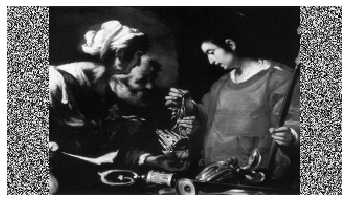

Prediction:


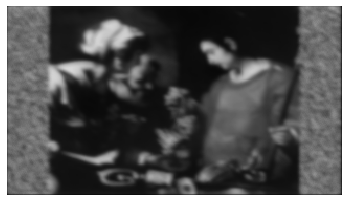

Original:


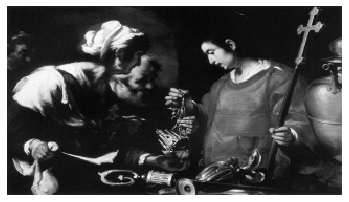

X static image:


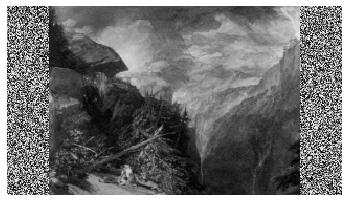

Prediction:


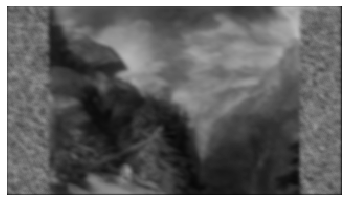

Original:


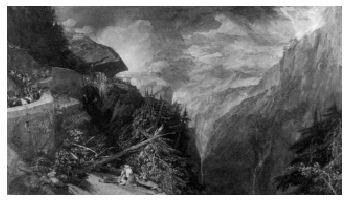

Epoch 1/2000 done, g-loss: 1.9060838222503662, d-loss: 0.8397442102432251, l1-loss: 24.103178024291992
X static image:


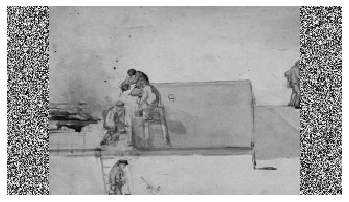

Prediction:


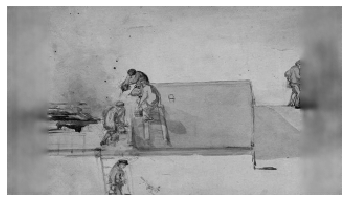

Original:


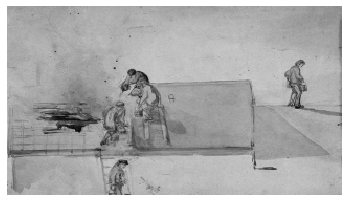

X static image:


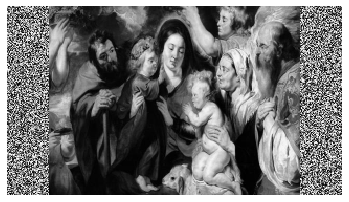

Prediction:


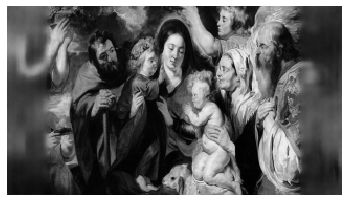

Original:


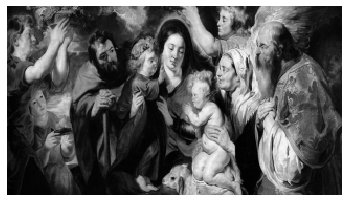

Epoch 101/2000 done, g-loss: 1.8206839561462402, d-loss: 0.8638749122619629, l1-loss: 9.305512428283691
X static image:


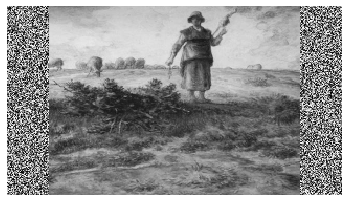

Prediction:


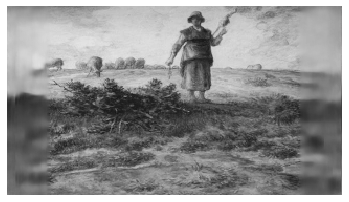

Original:


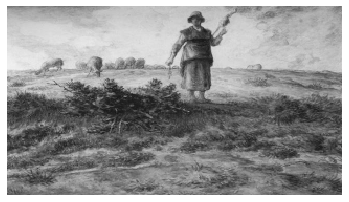

X static image:


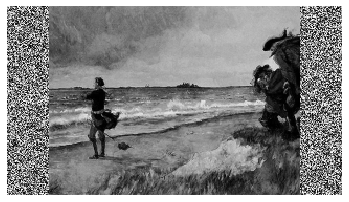

Prediction:


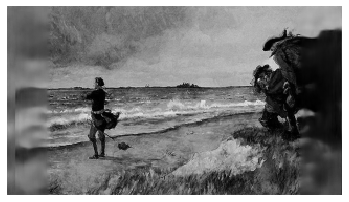

Original:


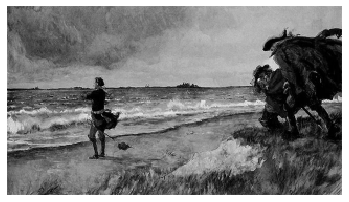

Epoch 201/2000 done, g-loss: 1.9057917594909668, d-loss: 0.8036068677902222, l1-loss: 5.7107930183410645
X static image:


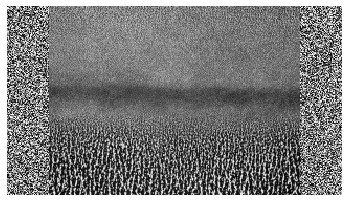

Prediction:


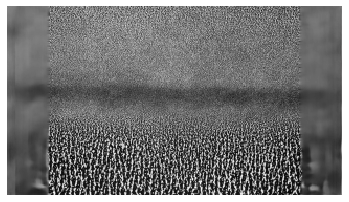

Original:


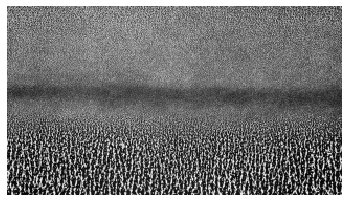

X static image:


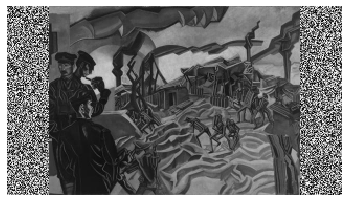

Prediction:


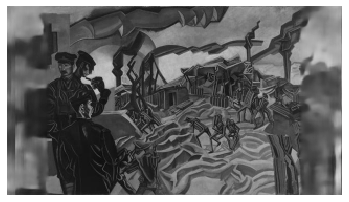

Original:


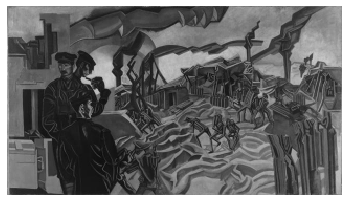

Epoch 301/2000 done, g-loss: 1.8076894283294678, d-loss: 0.861344575881958, l1-loss: 4.839536666870117
X static image:


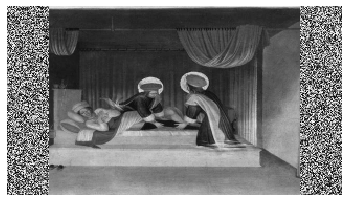

Prediction:


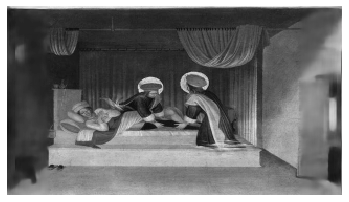

Original:


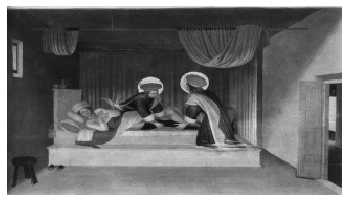

X static image:


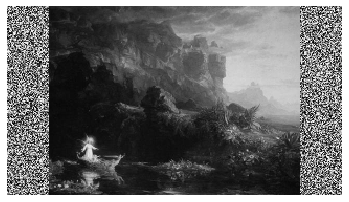

Prediction:


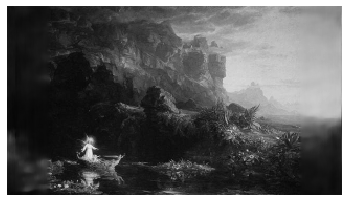

Original:


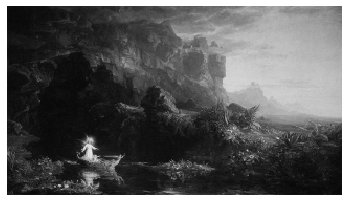

Epoch 401/2000 done, g-loss: 1.7308522462844849, d-loss: 0.9405239820480347, l1-loss: 2.6174495220184326
X static image:


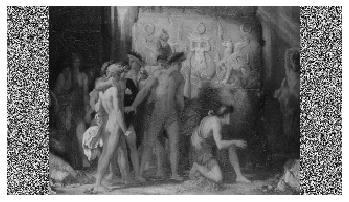

Prediction:


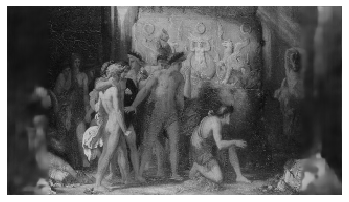

Original:


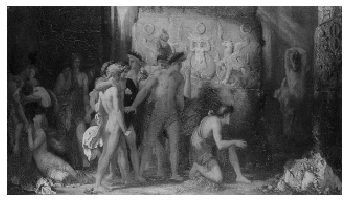

X static image:


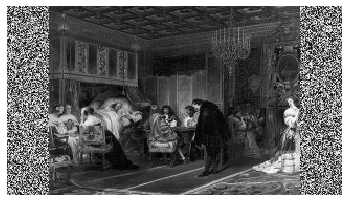

Prediction:


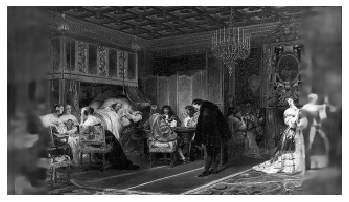

Original:


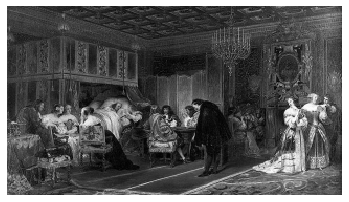

Epoch 501/2000 done, g-loss: 1.827901840209961, d-loss: 0.8707517385482788, l1-loss: 4.229184627532959
X static image:


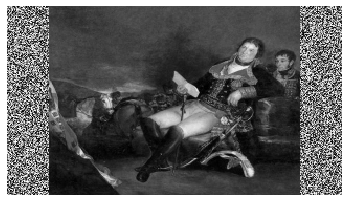

Prediction:


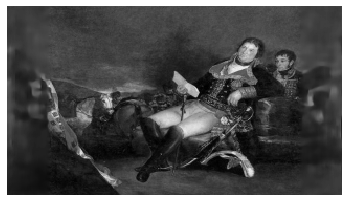

Original:


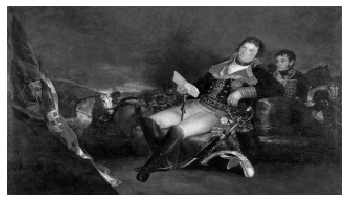

X static image:


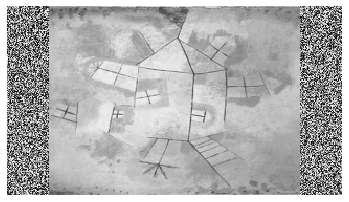

Prediction:


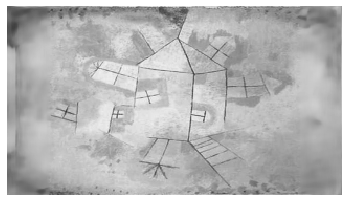

Original:


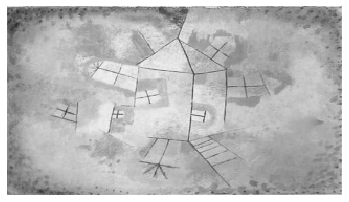

Epoch 601/2000 done, g-loss: 2.018381118774414, d-loss: 0.7478663325309753, l1-loss: 2.940282106399536
X static image:


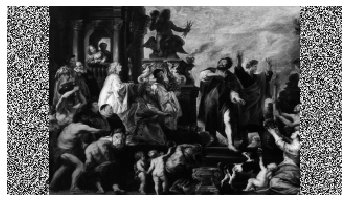

Prediction:


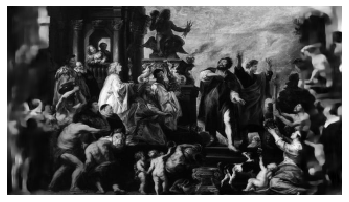

Original:


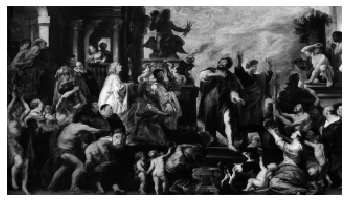

X static image:


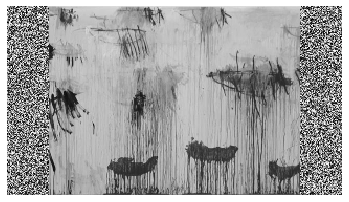

Prediction:


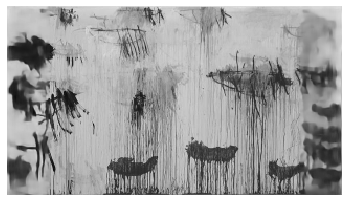

Original:


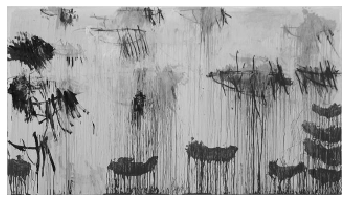

Epoch 701/2000 done, g-loss: 1.9858167171478271, d-loss: 0.7596241235733032, l1-loss: 3.393747091293335
X static image:


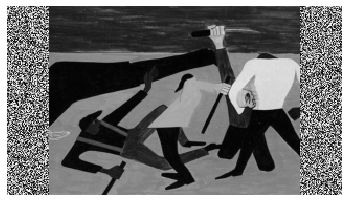

Prediction:


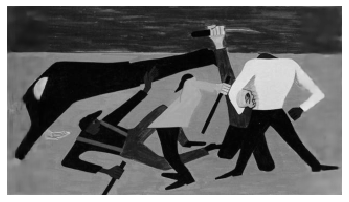

Original:


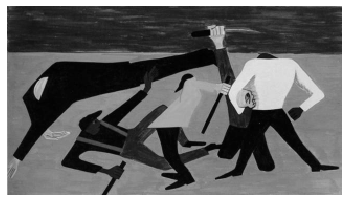

X static image:


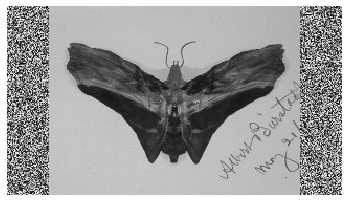

Prediction:


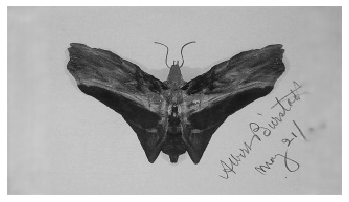

Original:


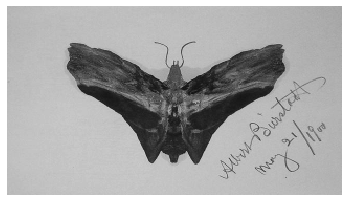

Epoch 801/2000 done, g-loss: 1.8931195735931396, d-loss: 0.8375790119171143, l1-loss: 1.898102045059204
X static image:


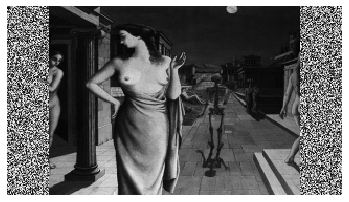

Prediction:


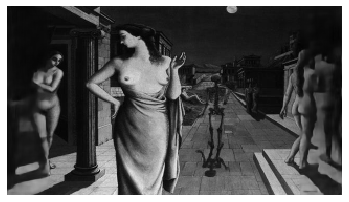

Original:


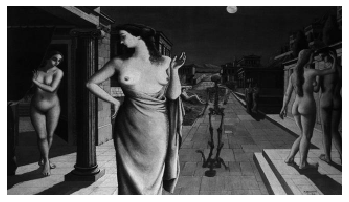

X static image:


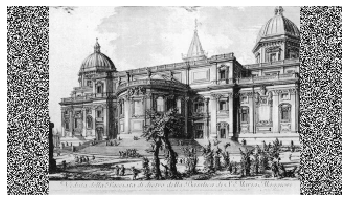

Prediction:


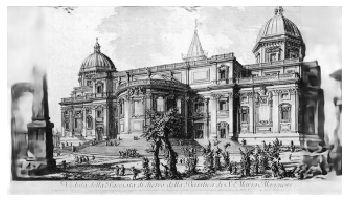

Original:


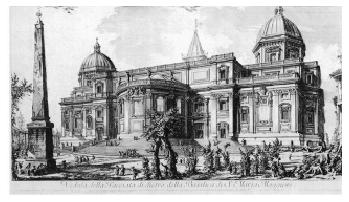

Epoch 901/2000 done, g-loss: 1.903141736984253, d-loss: 0.8340481519699097, l1-loss: 2.045492172241211
X static image:


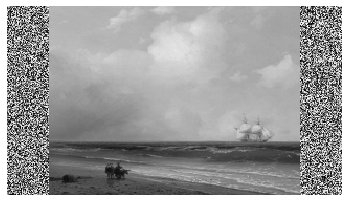

Prediction:


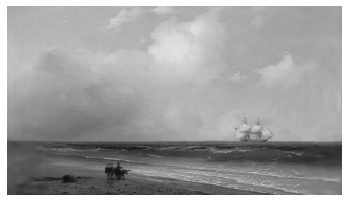

Original:


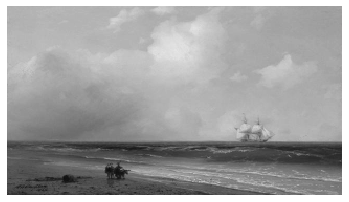

X static image:


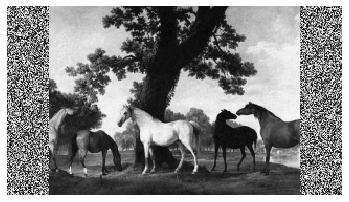

Prediction:


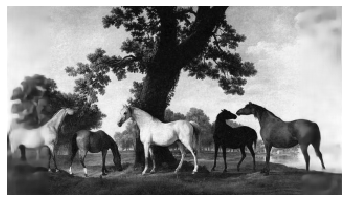

Original:


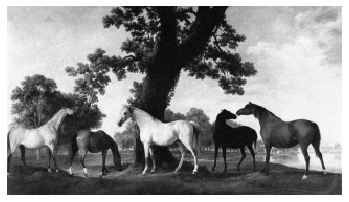

Epoch 1001/2000 done, g-loss: 1.9852700233459473, d-loss: 0.7535719871520996, l1-loss: 2.809786319732666
X static image:


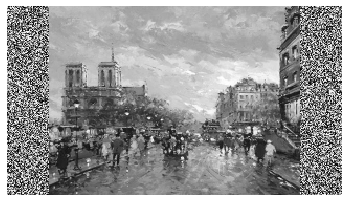

Prediction:


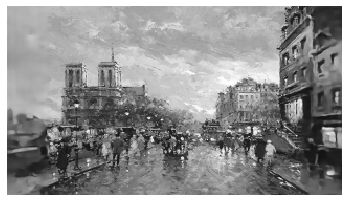

Original:


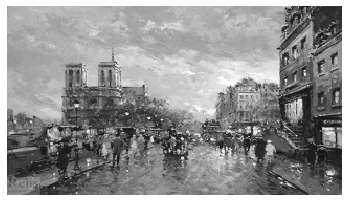

X static image:


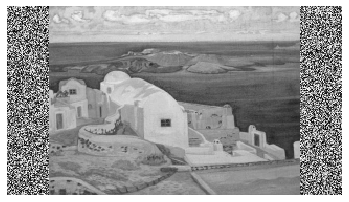

Prediction:


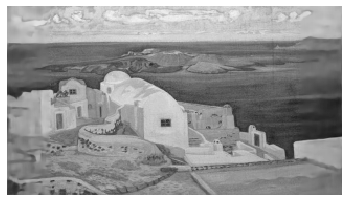

Original:


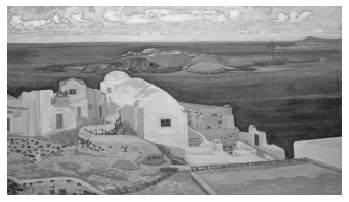

Epoch 1101/2000 done, g-loss: 1.955250859260559, d-loss: 0.790097713470459, l1-loss: 1.9368120431900024


In [0]:
batch_size = 10
epochs = 2000
learning_rate = 0.0002
beta_1 = 0.5
gan_weight=1
l1_weight=1

tf.get_logger().setLevel('WARNING')
tf.autograph.set_verbosity(2)
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'  # FATAL
logging.getLogger('tensorflow').setLevel(logging.FATAL)

generator = Generator()
g_opt = tf.keras.optimizers.Adam(learning_rate=0.0002, beta_1=beta_1)

discriminator1 = Discriminator()
discriminator2 = Discriminator()
d1_opt = tf.keras.optimizers.Adam(learning_rate=(0.0002), beta_1=beta_1)
d2_opt = tf.keras.optimizers.Adam(learning_rate=(0.0002), beta_1=beta_1)

best_gen = None
best_loss = float('inf')
for epoch in range(epochs):
  training_data = BatchLoader(data_path, training_paths, batch_size=batch_size)
  latest_batch_x = None
  latest_batch_y = None
  gen = None
  while True:
    i = 0
    batch_X, batch_y = training_data.get_next_batch()
    if type(batch_X).__name__ == 'NoneType':
      break
    latest_batch_y = batch_y
    left_static = np.random.randint(low=0, high=255, size=(batch_size, 40, 180, 1))
    right_static = np.random.randint(low=0, high=255, size=(batch_size, 40, 180, 1))
    batch_X = np.concatenate([left_static, batch_X, right_static], axis=1)
    latest_batch_x = batch_X
    with tf.GradientTape() as d1_tape, tf.GradientTape() as d2_tape, tf.GradientTape() as g_tape:
        gen = generator(batch_X)
        #gen = tf.keras.Model.load_weights(gen, '/content/drive/My Drive/models/my_checkpoint')
        first_bar_batch_y = (batch_y[np.arange(batch_y.shape[0]), 0:50])
        second_bar_batch_y = (batch_y[np.arange(batch_y.shape[0]), 270:])
        first_bar_gen = tf.slice(gen,[0, 0, 0, 0],[-1, 50, -1, -1])
        second_bar_gen = tf.slice(gen, [0, 270, 0, 0],[-1, 50, -1, -1])
        disc_first_bar_real = discriminator1((first_bar_batch_y))
        disc_second_bar_real = discriminator1(second_bar_batch_y)
        #first_bar_gen = tf.dtypes.cast(first_bar_gen, tf.dtypes.float32)
        disc_first_bar_gen = discriminator2(first_bar_gen)
        #second_bar_gen = tf.dtypes.cast(second_bar_gen, tf.dtypes.float32)
        disc_second_bar_gen = discriminator2(second_bar_gen)
        disc1_loss = gan_weight * d_loss(disc_first_bar_real, disc_first_bar_gen)
        disc2_loss = gan_weight * d_loss(disc_second_bar_real, disc_second_bar_gen)
        disc_loss = disc1_loss + disc2_loss

        gen_loss = g_loss(disc_first_bar_gen, disc_second_bar_gen, gen, batch_y, gan_weight=gan_weight)
        l1_loss = tf.keras.losses.MeanAbsoluteError()(batch_y, gen) * l1_weight
        total_gen_loss = gen_loss + l1_loss

        g_grad = g_tape.gradient(total_gen_loss, generator.trainable_variables)
        g_opt.apply_gradients(zip(g_grad, generator.trainable_variables))
        
        if i > 0:
          d1_grad = d1_tape.gradient(disc1_loss, discriminator1.trainable_variables)     
          d1_opt.apply_gradients(zip(d1_grad, discriminator1.trainable_variables))

          d2_grad = d2_tape.gradient(disc2_loss, discriminator2.trainable_variables)     
          d2_opt.apply_gradients(zip(d2_grad, discriminator2.trainable_variables))
  if ((gen_loss + l1_loss + disc_loss) / 3)< best_loss:
    best_gen = generator
    best_loss = gen_loss
    best_gen.save_weights('/content/drive/My Drive/models/gan_checkpoint2')
    #best_gen.save('/content/drive/My Drive/models/model.h5', save_format="tf")
  if epoch % 100 == 0:
    show_examples(latest_batch_x, latest_batch_y, gen, num=2)
    print('Epoch {}/{} done, g-loss: {}, d-loss: {}, l1-loss: {}'.format(epoch + 1, epochs, gen_loss, disc_loss, l1_loss))

print('Training complete')

X static image:


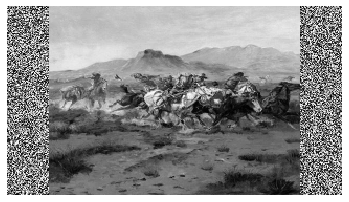

Prediction:


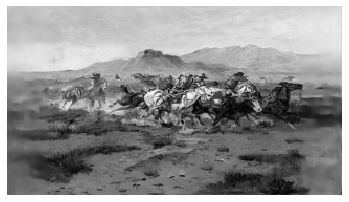

Original:


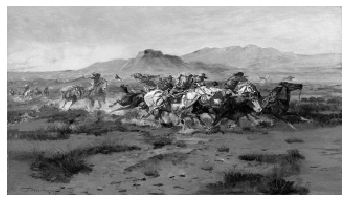

X static image:


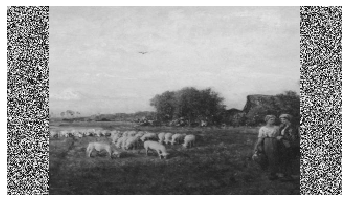

Prediction:


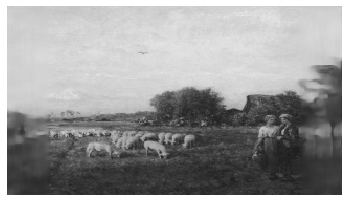

Original:


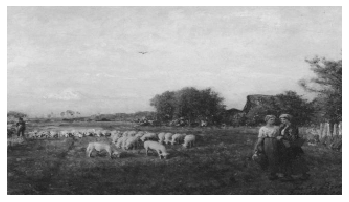

Epoch 1201/2000 done, g-loss: 2.4791512489318848, d-loss: 1.7932610511779785, l1-loss: 3.328246831893921
X static image:


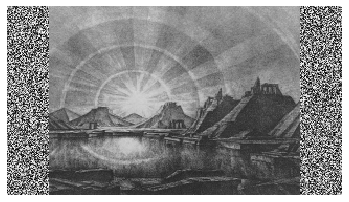

Prediction:


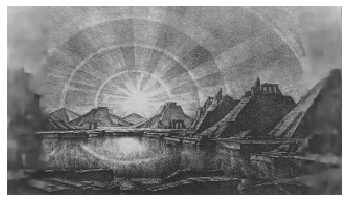

Original:


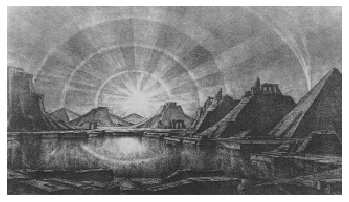

X static image:


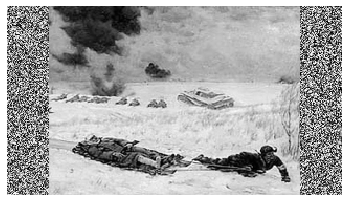

Prediction:


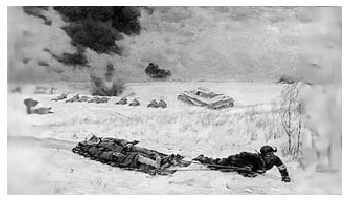

Original:


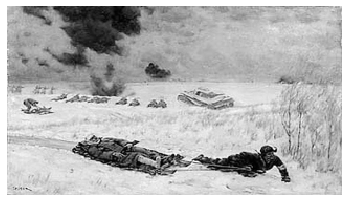

Epoch 1301/2000 done, g-loss: 2.713334321975708, d-loss: 1.8278732299804688, l1-loss: 2.6831960678100586
X static image:


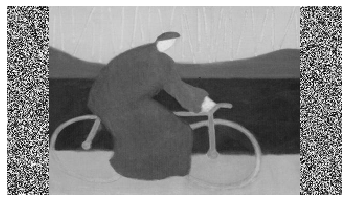

Prediction:


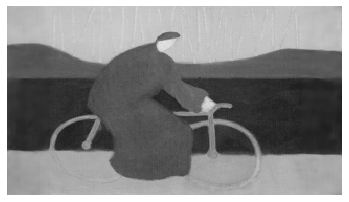

Original:


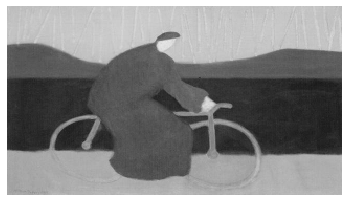

X static image:


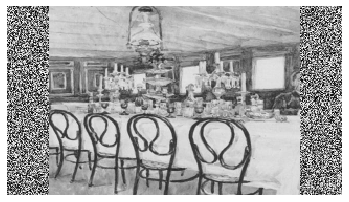

Prediction:


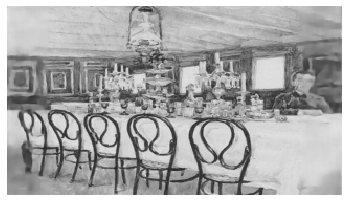

Original:


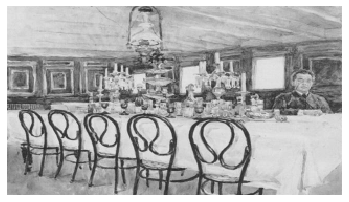

Epoch 1401/2000 done, g-loss: 2.4281363487243652, d-loss: 1.7530748844146729, l1-loss: 3.6937577724456787
X static image:


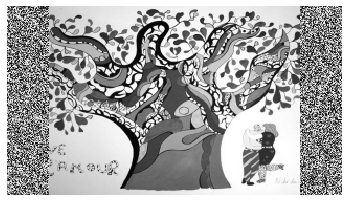

Prediction:


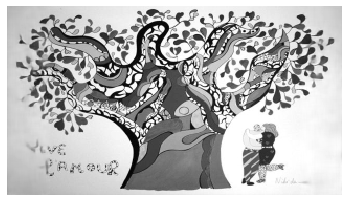

Original:


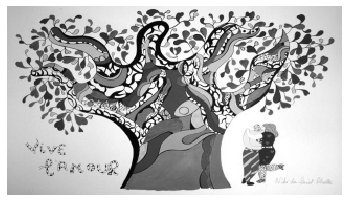

X static image:


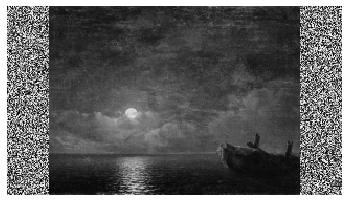

Prediction:


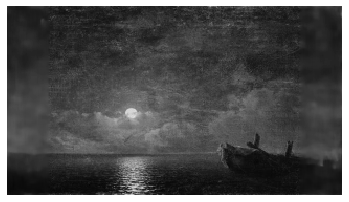

Original:


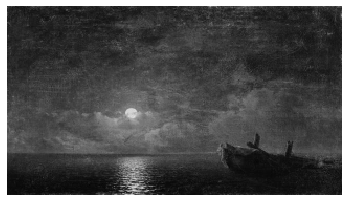

Epoch 1501/2000 done, g-loss: 2.508714437484741, d-loss: 1.7724378108978271, l1-loss: 2.127366304397583
X static image:


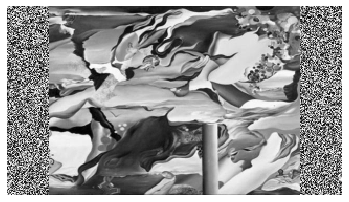

Prediction:


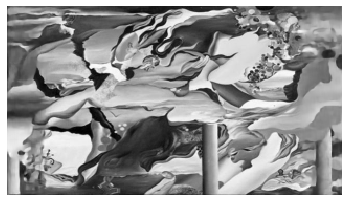

Original:


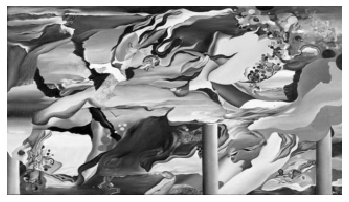

X static image:


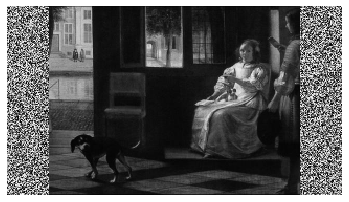

Prediction:


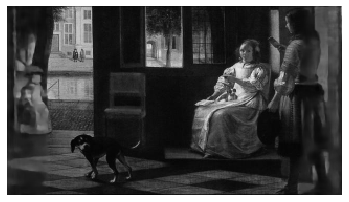

Original:


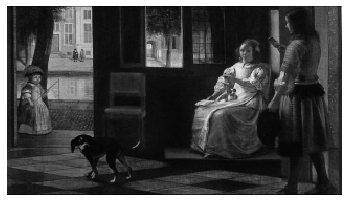

Epoch 1601/2000 done, g-loss: 2.6089677810668945, d-loss: 1.7746597528457642, l1-loss: 2.3282217979431152
X static image:


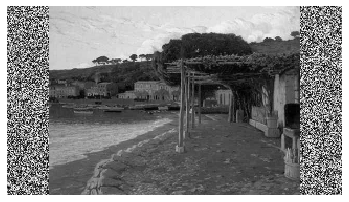

Prediction:


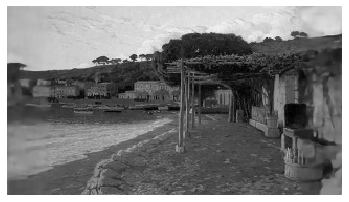

Original:


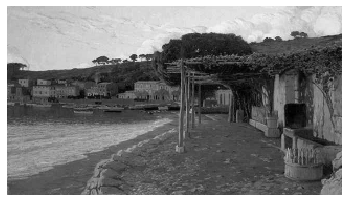

X static image:


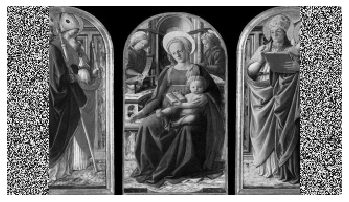

Prediction:


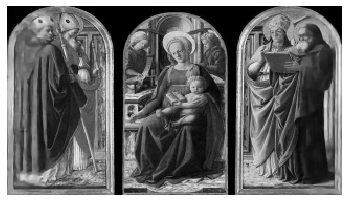

Original:


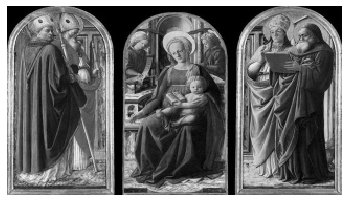

Epoch 1701/2000 done, g-loss: 2.195680618286133, d-loss: 1.6874582767486572, l1-loss: 2.882157802581787
X static image:


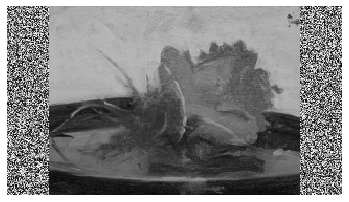

Prediction:


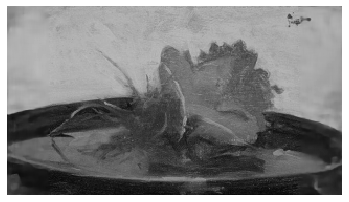

Original:


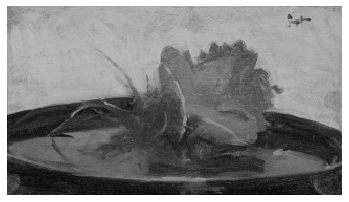

X static image:


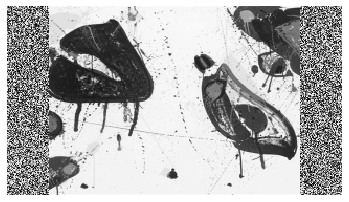

Prediction:


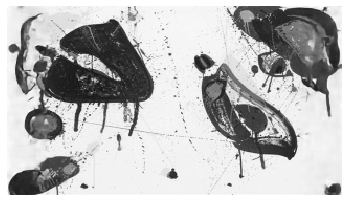

Original:


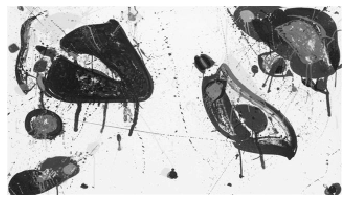

Epoch 1801/2000 done, g-loss: 2.387293815612793, d-loss: 1.7315798997879028, l1-loss: 2.3026440143585205
X static image:


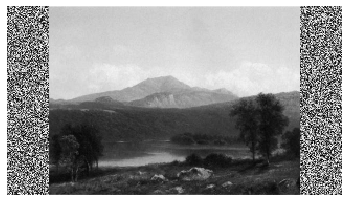

Prediction:


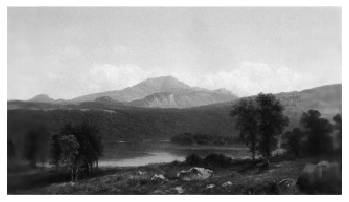

Original:


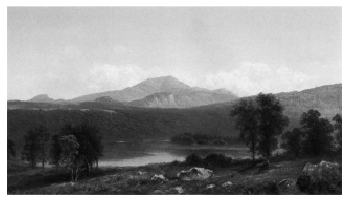

X static image:


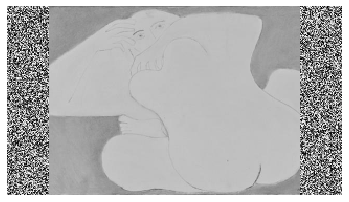

Prediction:


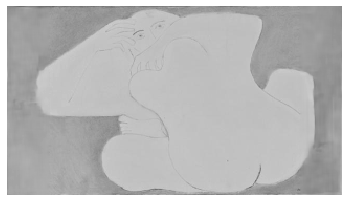

Original:


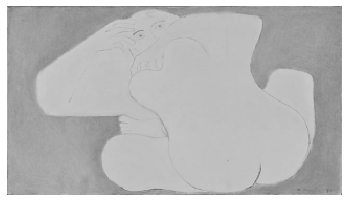

Epoch 1901/2000 done, g-loss: 2.599674701690674, d-loss: 1.759971261024475, l1-loss: 2.0394651889801025
Training complete


In [0]:
batch_size = 10
epochs = 2000
learning_rate = 0.0002
beta_1 = 0.5
gan_weight=1
l1_weight=1

tf.get_logger().setLevel('WARNING')
tf.autograph.set_verbosity(2)
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'  # FATAL
logging.getLogger('tensorflow').setLevel(logging.FATAL)

generator = Generator()
generator.load_weights('/content/drive/My Drive/models/gan_checkpoint2')

g_opt = tf.keras.optimizers.Adam(learning_rate=0.0002, beta_1=beta_1)

discriminator1 = Discriminator()
discriminator2 = Discriminator()
d1_opt = tf.keras.optimizers.Adam(learning_rate=(0.0002), beta_1=beta_1)
d2_opt = tf.keras.optimizers.Adam(learning_rate=(0.0002), beta_1=beta_1)

best_gen = None
best_loss = float('inf')
for epoch in range(1101, epochs):
  training_data = BatchLoader(data_path, training_paths, batch_size=batch_size)
  latest_batch_x = None
  latest_batch_y = None
  gen = None
  while True:
    i = 0
    batch_X, batch_y = training_data.get_next_batch()
    if type(batch_X).__name__ == 'NoneType':
      break
    latest_batch_y = batch_y
    left_static = np.random.randint(low=0, high=255, size=(batch_size, 40, 180, 1))
    right_static = np.random.randint(low=0, high=255, size=(batch_size, 40, 180, 1))
    batch_X = np.concatenate([left_static, batch_X, right_static], axis=1)
    latest_batch_x = batch_X
    with tf.GradientTape() as d1_tape, tf.GradientTape() as d2_tape, tf.GradientTape() as g_tape:
        gen = generator(batch_X)
        #gen = tf.keras.Model.load_weights(gen, '/content/drive/My Drive/models/my_checkpoint')
        first_bar_batch_y = (batch_y[np.arange(batch_y.shape[0]), 0:50])
        second_bar_batch_y = (batch_y[np.arange(batch_y.shape[0]), 270:])
        first_bar_gen = tf.slice(gen,[0, 0, 0, 0],[-1, 50, -1, -1])
        second_bar_gen = tf.slice(gen, [0, 270, 0, 0],[-1, 50, -1, -1])
        disc_first_bar_real = discriminator1((first_bar_batch_y))
        disc_second_bar_real = discriminator1(second_bar_batch_y)
        #first_bar_gen = tf.dtypes.cast(first_bar_gen, tf.dtypes.float32)
        disc_first_bar_gen = discriminator2(first_bar_gen)
        #second_bar_gen = tf.dtypes.cast(second_bar_gen, tf.dtypes.float32)
        disc_second_bar_gen = discriminator2(second_bar_gen)
        disc1_loss = gan_weight * d_loss(disc_first_bar_real, disc_first_bar_gen)
        disc2_loss = gan_weight * d_loss(disc_second_bar_real, disc_second_bar_gen)
        disc_loss = disc1_loss + disc2_loss

        gen_loss = g_loss(disc_first_bar_gen, disc_second_bar_gen, gen, batch_y, gan_weight=gan_weight)
        l1_loss = tf.keras.losses.MeanAbsoluteError()(batch_y, gen) * l1_weight
        total_gen_loss = gen_loss + l1_loss

        g_grad = g_tape.gradient(total_gen_loss, generator.trainable_variables)
        g_opt.apply_gradients(zip(g_grad, generator.trainable_variables))
        
        if i > 0:
          d1_grad = d1_tape.gradient(disc1_loss, discriminator1.trainable_variables)     
          d1_opt.apply_gradients(zip(d1_grad, discriminator1.trainable_variables))

          d2_grad = d2_tape.gradient(disc2_loss, discriminator2.trainable_variables)     
          d2_opt.apply_gradients(zip(d2_grad, discriminator2.trainable_variables))
  if ((gen_loss + l1_loss + disc_loss) / 3)< best_loss:
    best_gen = generator
    best_loss = gen_loss
    best_gen.save_weights('/content/drive/My Drive/models/gan_checkpoint3')
    #best_gen.save('/content/drive/My Drive/models/model.h5', save_format="tf")
  if epoch % 100 == 0:
    show_examples(latest_batch_x, latest_batch_y, gen, num=2)
    print('Epoch {}/{} done, g-loss: {}, d-loss: {}, l1-loss: {}'.format(epoch + 1, epochs, gen_loss, disc_loss, l1_loss))

print('Training complete')

# Save Model

In [0]:
best_gen.summary()
best_gen.save_weights('/content/drive/My Drive/models/my_checkpoint3')

# Test model on test data

In [0]:
b_gen = Generator()
b_gen.load_weights('/content/drive/My Drive/models/gan_checkpoint2')
#print("Restored model, accuracy: {:5.2f}%".format(100*acc))
#tf.keras.Model.load_weights(b_gen, filepath=latest, by_name=False)#checkpoints
#graph = tf.Graph()
#restore = tf.train.Checkpoint()
#restore.restore(tf.train.latest_checkpoint(latest))


X static image:


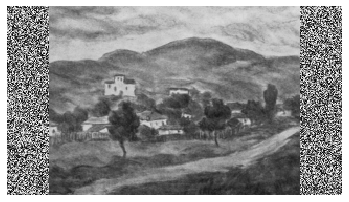

Prediction:


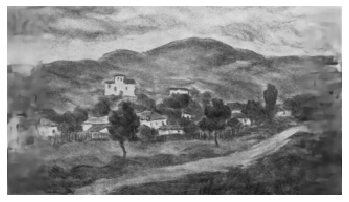

Original:


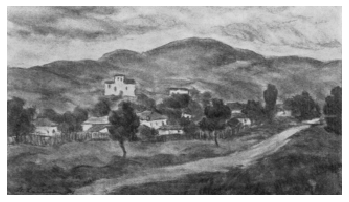

X static image:


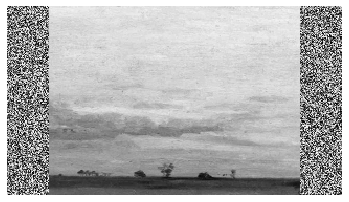

Prediction:


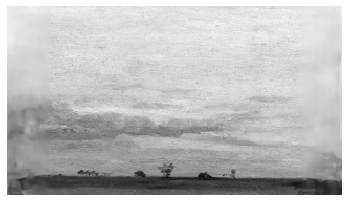

Original:


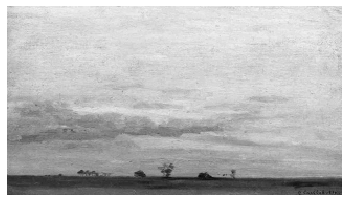

X static image:


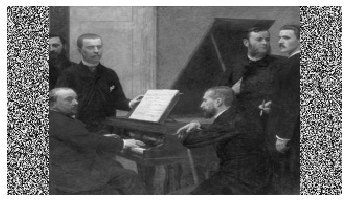

Prediction:


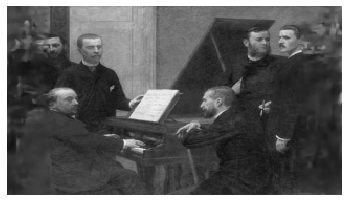

Original:


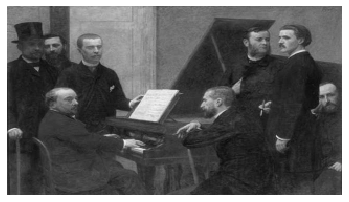

X static image:


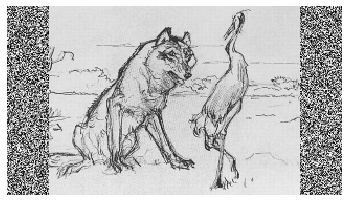

Prediction:


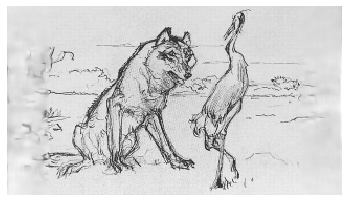

Original:


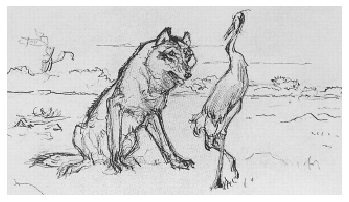

X static image:


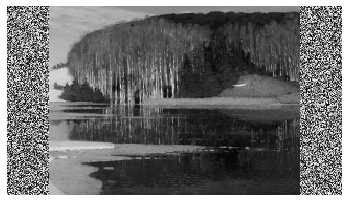

Prediction:


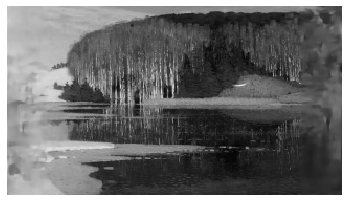

Original:


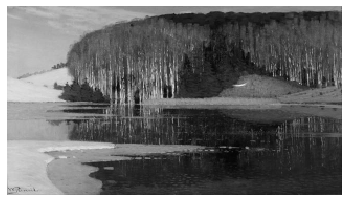

X static image:


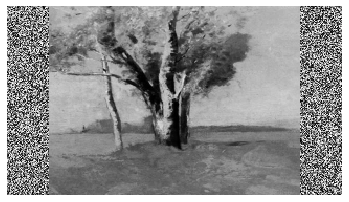

Prediction:


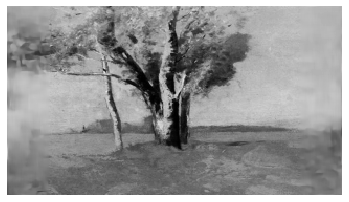

Original:


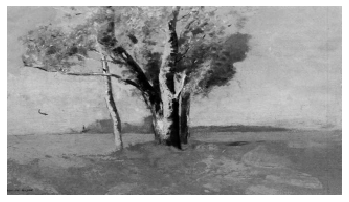

X static image:


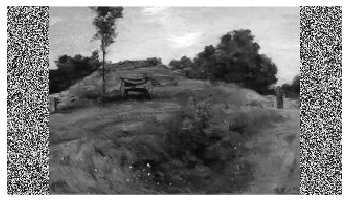

Prediction:


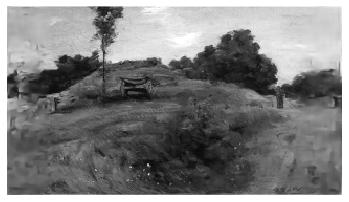

Original:


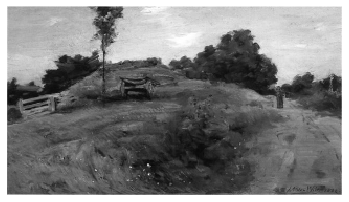

X static image:


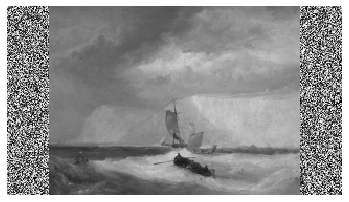

Prediction:


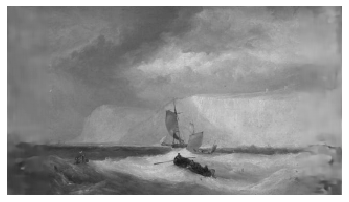

Original:


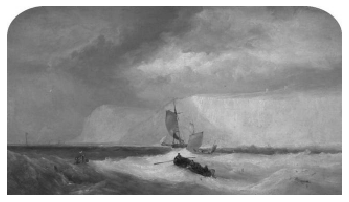

X static image:


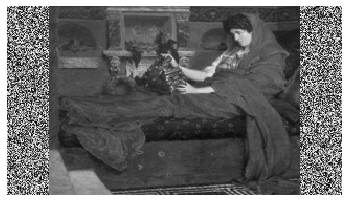

Prediction:


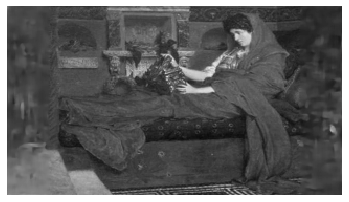

Original:


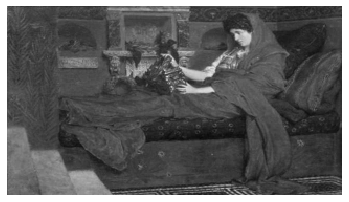

X static image:


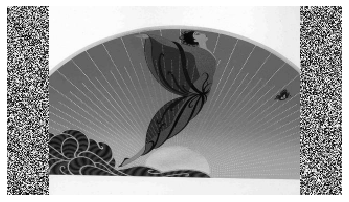

Prediction:


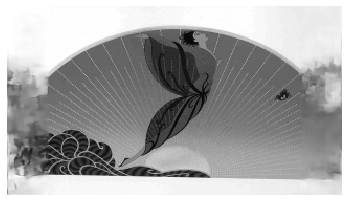

Original:


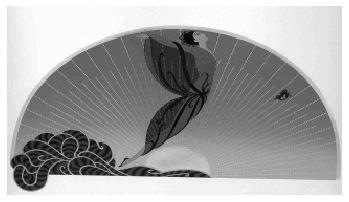

In [0]:
number_of_test_images_to_show = 10

testing_data = BatchLoader(data_path, testing_paths, batch_size=number_of_test_images_to_show)
testing_X, testing_y = testing_data.get_next_batch()
left_static = np.random.randint(low=0, high=255, size=(number_of_test_images_to_show, 40, 180, 1))
right_static = np.random.randint(low=0, high=255, size=(number_of_test_images_to_show, 40, 180, 1))
testing_X = np.concatenate([left_static, testing_X, right_static], axis=1)
predictions = b_gen.predict_on_batch(testing_X)
show_examples(testing_X, testing_y, predictions, num=number_of_test_images_to_show)

(180, 320, 3)


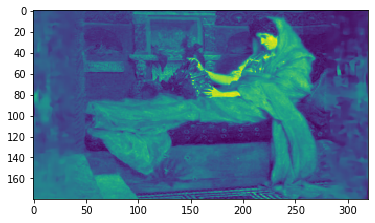

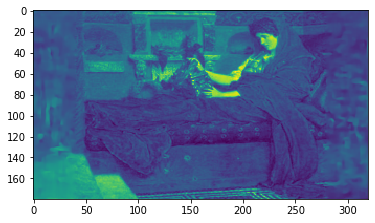

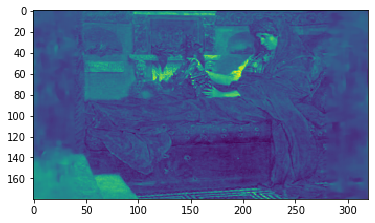

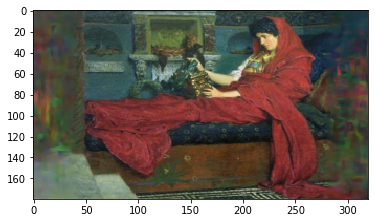

In [0]:
number_of_test_images_to_show = 10

testing_data1 = BatchLoaderRGB(data_path, testing_paths, batch_size=number_of_test_images_to_show)
testing_data2 = BatchLoaderRGB(data_path, testing_paths, batch_size=number_of_test_images_to_show)
testing_data3 = BatchLoaderRGB(data_path, testing_paths, batch_size=number_of_test_images_to_show)
testing_X1, testing_y1 = testing_data1.get_next_batch(channel=0)
testing_X2, testing_y2 = testing_data2.get_next_batch(channel=1)
testing_X3, testing_y3 = testing_data3.get_next_batch(channel=2)
left_static = np.random.randint(low=0, high=255, size=(number_of_test_images_to_show, 40, 180, 1))
right_static = np.random.randint(low=0, high=255, size=(number_of_test_images_to_show, 40, 180, 1))
testing_X1 = np.concatenate([left_static, testing_X1, right_static], axis=1)
testing_X2 = np.concatenate([left_static, testing_X2, right_static], axis=1)
testing_X3 = np.concatenate([left_static, testing_X3, right_static], axis=1)
predictions1 = b_gen.predict_on_batch(testing_X1)
predictions2 = b_gen.predict_on_batch(testing_X2)
predictions3 = b_gen.predict_on_batch(testing_X3)
testing_x = np.zeros([testing_X1.shape[0], testing_X1.shape[1], testing_X1.shape[2], 3])
testing_y = np.zeros([testing_y1.shape[0], testing_y1.shape[1], testing_y1.shape[2], 3])
predictions = np.zeros([predictions1.shape[0], predictions1.shape[1], predictions1.shape[2], 3])
testing_x[:, :, :, 0] = testing_X1[:, :, :, 0]
testing_x[:, :, :, 1] = testing_X1[:, :, :, 0]
testing_x[:, :, :, 2] = testing_X1[:, :, :, 0]
testing_y[:, :, :, 0] = testing_y1[:, :, :, 0]
testing_y[:, :, :, 1] = testing_y2[:, :, :, 0]
testing_y[:, :, :, 2] = testing_y3[:, :, :, 0]
predictions[:, :, :, 0] = predictions3[:, :, :, 0]
predictions[:, :, :, 1] = predictions2[:, :, :, 0]
predictions[:, :, :, 2] = predictions1[:, :, :, 0]
img = predictions[8, :, :, :]
img = np.moveaxis(img, 0, 1).astype(int)
#print(img)
print(img.shape)
plt.figure(0)
plt.imshow(img[:, :, 0]);
plt.figure(1)
plt.imshow(img[:, :, 1]);
plt.figure(2)
plt.imshow(img[:, :, 2]);
plt.figure(3)
plt.imshow(img);
#print(testing_x.shape)
#show_examplesRGB(testing_X, testing_y, predictions, num=number_of_test_images_to_show)